In [18]:
import pandas as pd
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.cluster import KMeans
import plotly.express as px

In [2]:
caminho_script = 'E:/Coisas/Notas4/upperbag/'
caminho_arquivos = caminho_script + 'csvs/'
caminho_arquivos_raw = caminho_arquivos + 'raw/'
caminho_arquivos_tratados = caminho_arquivos + 'tratado/'
caminho_arquivos_vazios = caminho_arquivos + 'vazio/'

In [3]:
df_que_fem_sec = pd.read_csv( caminho_arquivos_tratados + 'quest_fem_secure.csv', encoding='utf-8')

In [4]:
#df_que_fem_sec.head()

In [5]:
def coluna_nao_aberta( nm_coluna ):
    retorno = True
    if nm_coluna.find('(outro - comente)') != -1:
        retorno = False
    if nm_coluna.find('(outros detalhes que voce nao gosta?)') != -1:
        retorno = False
    return retorno

colunas = ['ds_motivo_bag'
            ,'ds_cores'
            ,'ds_freq_casual'
            ,'ds_freq_lazer'
            ,'ds_freq_sair'
            ,'ds_freq_social'
            ,'ds_tipo_corpo'
            ,'ds_tipo_calcado'
            ,'ds_estilo'
            #,'ds_piores_itens'
            ,'ds_fator_importancia'
            ,'ds_combinacoes'
            ,'ds_acessorio'
            ,'ds_tipo_calcinha'
            ,'ds_itens_favoritos'
            ,'ds_decote_colo'
            ,'ds_pernas'
            ,'ds_braco'
            ,'ds_costas'
            ,'ds_bad_estampa'
            ,'ds_bad_material'
            ,'ds_tipo_salto'
            ,'ds_bad_calcado'
            ,'ds_tipo_vestimenta'
            ,'ds_problema_tamanho'
            ,'ds_caimento_blusa'
            ,'ds_caimento_calca'
            ,'ds_tipo_cintura_calca'
            ,'ds_tipo_calca'
            #,'ds_bad_blusa'
            ,'ds_disposto_inovar'
            ,'ds_estilo_interview'
            ,'ds_tipo_alca_sutia'
            #,'ds_marca_favorita'
          ]

df_que_fem_sec_dummies = df_que_fem_sec.copy()
for coluna in colunas:
    df = df_que_fem_sec_dummies[coluna].str.replace(', ', ',', regex=True).str.get_dummies( sep=',' )
    for col in df.columns:
        if coluna_nao_aberta( col ): #tira comentarios
            df_que_fem_sec_dummies[coluna + '->' + col] = df[col]

In [6]:
pular_colunas = 54
for col in df_que_fem_sec_dummies.columns[pular_colunas:]:
    print(col)

ds_motivo_bag->ajuda profissional
ds_motivo_bag->basicos
ds_motivo_bag->calcados
ds_motivo_bag->itens basico
ds_motivo_bag->mais calcado
ds_motivo_bag->na
ds_motivo_bag->noite
ds_motivo_bag->novidades
ds_motivo_bag->renovar guarda
ds_motivo_bag->renovar guarda roupas
ds_motivo_bag->roupas para sair a noit
ds_motivo_bag->roupas para trabalho informa
ds_motivo_bag->surpresa
ds_motivo_bag->trabalho informal
ds_motivo_bag->trabalho socia
ds_motivo_bag->trabalho social
ds_motivo_bag->varidades e roupas para todos os estilos e ocasioe
ds_motivo_bag->variedades
ds_motivo_bag->variedades e roupas para todos os estilos e ocasioe
ds_cores->amarelo
ds_cores->azul
ds_cores->branco
ds_cores->cinza
ds_cores->etnico
ds_cores->floral
ds_cores->khaki
ds_cores->laranja
ds_cores->lb
ds_cores->listras
ds_cores->marinho
ds_cores->marrom
ds_cores->militar
ds_cores->poa
ds_cores->preto
ds_cores->rosa
ds_cores->roxo
ds_cores->salmao
ds_cores->verde
ds_cores->vermelho
ds_freq_casual->1-2x semana
ds_freq_casual

In [7]:
cols = df_que_fem_sec_dummies.columns[pular_colunas:]
print('Quantidade de colunas = %i' %len(cols))
data = df_que_fem_sec_dummies[ cols ].to_numpy()
print('Quantidade de linhas = %i' %len(data))

Quantidade de colunas = 349
Quantidade de linhas = 72421


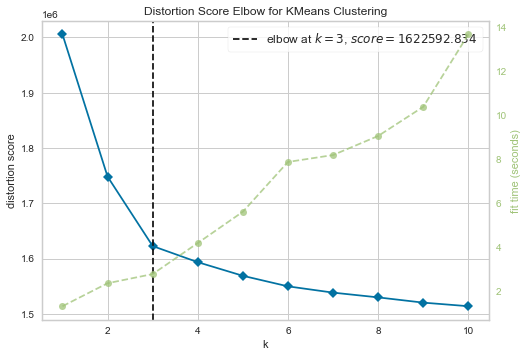

C:\Users\Odete\AppData\Roaming\Python\Python37\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


KElbowVisualizer(ax=<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>,
                 k=None, model=None)

In [8]:
kelbow_visualizer(KMeans(random_state=4), data, k=(1,11))

In [9]:
kmeans = KMeans( n_clusters=3 )
kmeans.fit( data )

KMeans(n_clusters=3)

In [11]:
df_que_fem_sec_dummies['predicao_kmeans'] = df_que_fem_sec_dummies.apply(lambda row:kmeans.predict(row[cols].to_numpy().reshape(-1,len(cols)))[0],axis=1)

In [12]:
df_que_fem_sec_dummies['predicao_kmeans'].value_counts()

0    32173
1    20346
2    19902
Name: predicao_kmeans, dtype: int64

In [13]:
df_que_fem_sec_predicted = df_que_fem_sec_dummies[['nm_cliente', 'predicao_kmeans']].copy()
df_que_fem_sec_predicted.to_csv( caminho_arquivos_tratados + 'predicoes_fem_persona.csv', index=False )
#df_que_fem_sec.truncate(after=-1)[['id_cliente', 'predicao_kmeans']].to_csv( caminho_arquivos_vazios + 'predicoes_fem_v1.csv', index=False )

In [24]:
df_fem_sec = pd.read_csv( caminho_arquivos_tratados + 'feminino_secure.csv', encoding='utf-8') # importa

df_fem_sec_vl = df_fem_sec.dropna(subset=['vl_compra'])
df_fem_sec_vl['vl_compra'] = df_fem_sec_vl.apply(lambda row: str(row['vl_compra']).replace('r$', ''), axis=1)
df_fem_sec_vl['vl_compra'] = df_fem_sec_vl.apply(lambda row: row['vl_compra'] if len(row['vl_compra']) < 8 else 0, axis=1)
df_fem_sec_vl = df_fem_sec_vl[df_fem_sec_vl['vl_compra'] != 0]
df_vl = df_fem_sec_vl[['nm_cliente', 'vl_compra']]
df_vl['vl_compra'] = df_vl['vl_compra'].astype('float64')

df_fem_sec_qt = df_fem_sec.dropna(subset=['qtd_itens_comprados', 'qtd_bags_enviadas'])
df_qt = df_fem_sec_qt[['nm_cliente', 'qtd_itens_comprados', 'qtd_bags_enviadas']]
df_qt['qtd_itens_comprados'] = df_qt['qtd_itens_comprados'].astype('int64')
df_qt['qtd_bags_enviadas'] = df_qt['qtd_bags_enviadas'].astype('int64')

agg_vl = {'vl_compra':['mean']}
df_agg_vl = df_vl.groupby(['nm_cliente']).agg( agg_vl ) # agrega
df_agg_vl_col = df_agg_vl.copy()
df_agg_vl_col.columns = df_agg_vl_col.columns.map('_'.join)
df_agg_vl_col.shape

agg_qt = {'qtd_itens_comprados':['mean'], 'qtd_bags_enviadas':['max']}
df_agg_qt = df_qt.groupby(['nm_cliente']).agg( agg_qt ) # agrega
df_agg_qt_col = df_agg_qt.copy()
df_agg_qt_col.columns = df_agg_qt_col.columns.map('_'.join)
df_agg_qt_col.shape

df = df_agg_vl_col.join( df_agg_qt_col, on='nm_cliente', how='inner' )
df_sec = df[ ((df['vl_compra_mean'] > 0) & (df['qtd_itens_comprados_mean'] > 0)) | ((df['vl_compra_mean'] == 0) & (df['qtd_itens_comprados_mean'] == 0)) ]

C:\Users\Odete\AppData\Roaming\Python\Python37\site-packages\IPython\core\interactiveshell.py:3072: DtypeWarning:

Columns (17,18,19,24,25,26,28,29,37,40,41) have mixed types.Specify dtype option on import or set low_memory=False.

C:\Users\Odete\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Odete\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Odete\A

In [27]:
df_que_fem_sec_predicted['nm_cliente'] = df_que_fem_sec_predicted['nm_cliente'].astype('string')
df_join = df_que_fem_sec_predicted.join( df_sec, on='nm_cliente', how='left', rsuffix='_' )

In [28]:
df_join

,nm_cliente,predicao_kmeans,vl_compra_mean,qtd_itens_comprados_mean,qtd_bags_enviadas_max
0,5ed073c32a783b7bd0ef71e10d6558ea17a08aef01fb7c...,2,NaN,NaN,NaN
1,d5b0c4f7bf4e8418fb234dd02311560e6031d75430363a...,1,NaN,NaN,NaN
2,a2bec4d6cbe59c8166bf70a0b42790efac917afd18c61c...,2,NaN,NaN,NaN
3,0b345dd2924d590dce7cceeaf23742e9b07c1bd9a1222f...,1,NaN,NaN,NaN
4,b35d1c38f73bb9878fb0da183b81e768c29fae9ce2f8b9...,2,NaN,NaN,NaN
...,...,...,...,...,...
72416,bbe2f756958461d4da6c7d80315af12833bd626007ec9e...,0,NaN,NaN,NaN
72417,bbe2f756958461d4da6c7d80315af12833bd626007ec9e...,1,NaN,NaN,NaN
72418,d52adbbcbca5c5e891a4547f04c860d6c1fb73cbc18307...,0,NaN,NaN,NaN
72419,fa0621a4d67c267bd8946fd5cda6dd89579de51861744a...,0,NaN,NaN,NaN


In [34]:
df_que_fem_sec_dummies['predicao_kmeans'].value_counts()

0    32173
1    20346
2    19902
Name: predicao_kmeans, dtype: int64

In [33]:
df_join.dropna()['predicao_kmeans'].value_counts()

2    752
0    495
1    117
Name: predicao_kmeans, dtype: int64

In [30]:
fig = px.box(df_join, y=['vl_compra_mean'], color='predicao_kmeans')
fig.show()

In [31]:
fig = px.box(df_join, y=['qtd_itens_comprados_mean'], color='predicao_kmeans')
fig.show()

In [32]:
fig = px.box(df_join, y=['qtd_bags_enviadas_max'], color='predicao_kmeans')
fig.show()